## Aquisition Timeline
Use the search_results.csv file to build an aquisition timeline for viewing

To be run in the `plotting` env

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from datetime import datetime

# =============================================================================
# User settings
# =============================================================================

DATA_DIR = "/Volumes/T9_InSAR/2026-04-14_nevada/"
CSV_FILE = f"{DATA_DIR}search_results.csv"
# OUTPUT_FILE = f"{DATA_DIR}S1_acquisition_timeline.png"

EQ_TIME = datetime(2026, 4, 14, 1, 29, 12)
EQ_LABEL = "M5.7 Earthquake"
hypocenter = [-119.008,39.335] #lon, lat

# =============================================================================
# Read and organize acquisition data
# =============================================================================

df = pd.read_csv(CSV_FILE)

# Convert acquisition timestamps to datetime objects
df["Start Time"] = pd.to_datetime(df["Start Time"])

# Sort chronologically
df = df.sort_values("Start Time")

# Unique path numbers (e.g., 64, 144)
tracks = sorted(df["Path Number"].unique())

# Assign vertical positions for plotting
levels = np.arange(len(tracks), 0, -1)
track_to_level = dict(zip(tracks, levels))
df["Start Time"][0]

Timestamp('2026-05-12 02:56:10+0000', tz='UTC')

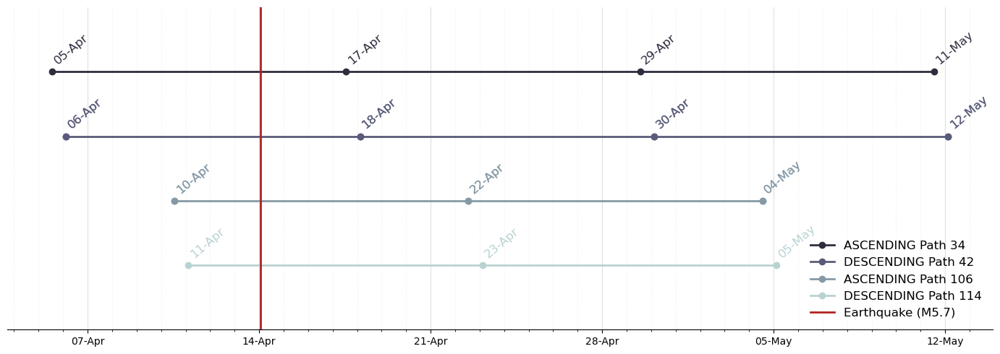

In [13]:


# =============================================================================
# Create figure
# =============================================================================

fig, ax = plt.subplots(figsize=(14, 5))


# Define color map
groups = list(df.groupby("Path Number"))
n_groups = len(groups)

# Divide the cmap into sections 1/n, where n is the number of paths 
cmap = plt.get_cmap("bone")
colors = cmap(
    np.linspace(
        1/(n_groups+1),
        n_groups/(n_groups+1),
        n_groups
    )
)

# colors = cmap(np.linspace(0.15, 0.9, len(tracks)))

# =============================================================================
# Plot acquisitions by path
# =============================================================================
scene_color = {}
for (track, subset), color in zip(
    df.groupby("Path Number"),
    colors
):

    subset = subset.sort_values("Start Time")

    for granule in subset["Granule Name"]:
        scene_color[granule] = color

    dates = subset["Start Time"]
    direction = subset["Ascending or Descending?"].iloc[0]
    level = track_to_level[track]

    ax.plot(
        dates,
        np.full(len(dates), level),
        "o-",
        lw=2,
        ms=6,
        color=color,
        label=f"{direction} Path {track}",
    )

    # Label each acquisition point
    for date in dates:
        ax.text(
            date,
            level + 0.08,
            date.strftime("%d-%b"),
            color=color,
            fontsize=12,
            rotation=40,
            ha="left",
            va="bottom",
        )
# =============================================================================
# Add earthquake marker
# =============================================================================

ax.axvline(
    EQ_TIME,
    color="firebrick",
    linewidth=2,
    label='Earthquake (M5.7)',
)

# ax.text(
#     EQ_TIME,
#     len(tracks) + 0.8,
#     EQ_LABEL,
#     color="firebrick",
#     rotation=90,
#     va="top",
#     ha="right",
# )

# =============================================================================
# Axis formatting
# =============================================================================

# Hide y-axis since levels are only used for separation
ax.set_ylim(0, len(tracks) + 1)
ax.yaxis.set_visible(False)

# Remove unnecessary frame elements
ax.spines["left"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

# Weekly labels
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))

# Daily tick marks
ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))

# Label format: 14-Apr
ax.xaxis.set_major_formatter(
    mdates.DateFormatter("%d-%b")
)

# Rotate labels vertically
plt.setp(
    ax.get_xticklabels(),
    rotation=0,
    ha="center"
)

# Grid lines
ax.grid(
    which="major",
    axis="x",
    linestyle="-",
    alpha=0.4,
)

ax.grid(
    which="minor",
    axis="x",
    linestyle=":",
    alpha=0.2,
)

# =============================================================================
# Finalize and save
# =============================================================================

ax.legend(frameon=False, fontsize=12)

plt.tight_layout()

plt.savefig(
    f"{DATA_DIR}S1_acquisition_timeline.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [86]:
# Read CMT File and plot

import sys
sys.path.append("/Users/hyin/soft/shakemap-postprocess-tools/shakemap_utils/")
sys.path.append("/Users/hyin/soft/shakemap-postprocess-tools/get-moment-tensor/")
sys.path.append("/Users/hyin/soft/shakemap-postprocess-tools/plot_ruptquads/")
from custom_utils import parse_mt, plot_mt
from getMomentTensor import get_moment_tensor

mt, eventid = parse_mt('/Volumes/T9_InSAR/2026-04-14_nevada/S1_D144/nn00914068_tensor.json')
plot_mt(mt, eventid, outdir=DATA_DIR)



Saved beachball PNG to /Volumes/T9_InSAR/2026-04-14_nevada//nn00914068_moment-tensor.png


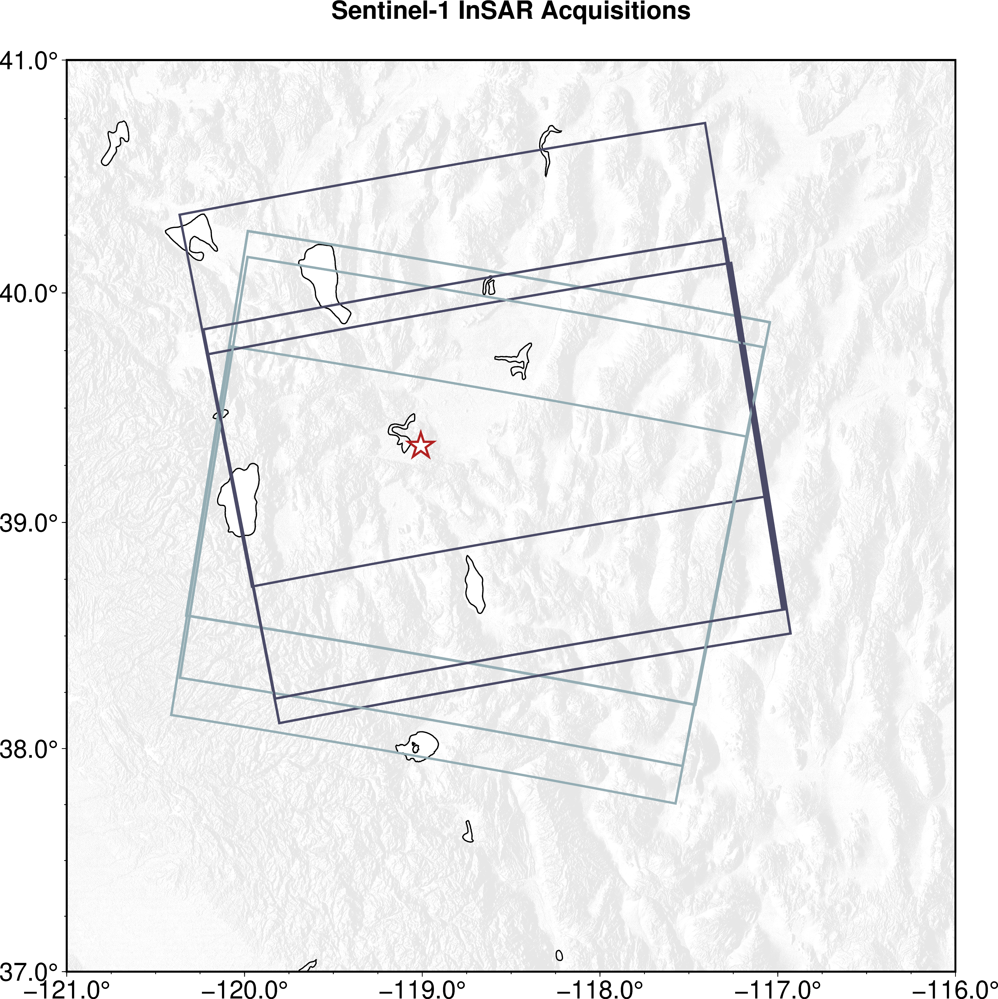

In [89]:
import pygmt

fig = pygmt.Figure()

region = [-121, -116, 37, 41]
# Set PyGMT universal configurations
pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain", FONT="24p")
projection = 'M0/0/30c'

fig.basemap(
    region=region,
    projection=projection,
    frame=True,
)

# Plot topography grd
pygmt.makecpt(cmap="gray", series=[-10, 0, 0.01])
fig.grdimage(
    grid='/Volumes/T9_InSAR/2026-04-14_nevada/topo/dem_grad.grd',
    frame=["lSEt+tSentinel-1 InSAR Acquisitions"],
    cmap=True,
    region=region,
)

fig.coast(
    shorelines="1p,black",
    borders="1/0.5p,black",
)

# Plot hypocenter
fig.plot(x=hypocenter[0], y = hypocenter[1], style="a0.9c", pen="2p,firebrick", fill="white", label="Hypocenter")


for _, row in df.iterrows():

    granule = row["Granule Name"]
    path = row["Path Number"]
    direction = row["Ascending or Descending?"]
    from shapely.geometry import Polygon

    poly = Polygon([
        (row["Near Start Lon"], row["Near Start Lat"]),
        (row["Far Start Lon"],  row["Far Start Lat"]),
        (row["Far End Lon"],    row["Far End Lat"]),
        (row["Near End Lon"],   row["Near End Lat"]),
        (row["Near Start Lon"], row["Near Start Lat"]),
    ])

    ## Color Lookup
    color = scene_color[granule]

    # matplotlib RGBA (0-1) -> GMT RGB string
    r, g, b = (np.array(color[:3]) * 255).astype(int)

    gmt_color = f"{r}/{g}/{b}"

    fig.plot(
        x=list(poly.exterior.coords.xy[0]),
        y=list(poly.exterior.coords.xy[1]),
        pen=f"2p,{gmt_color}"
    )
fig.show()

fig.savefig(
    f"{DATA_DIR}S1_acquisition_map.png",
    dpi=300,
)

plt.show()